# The Task

Find a risky transaction that will become a chargeback (state=chargeback or refund+fees)

Enclosed are

Transactions with their meta data
Subscriptions, Each transaction create a subscription object
User attributes, what we collected about a user
User identified by ClientID and by a GUID (a PC unique stamp, usually 1 pc = 1 user)

There is a lot of extra info that may or may not be used

Transactions https://fast-test-datasci.s3.amazonaws.com/trans.rar

Subscriptions https://fast-test-datasci.s3.amazonaws.com/ccsubs.rar

User Attribute https://fast-test-datasci.s3.amazonaws.com/attr.rar

## >Використані бібліотеки

In [51]:
from sklearn import datasets
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import sklearn
from sklearn.preprocessing import OneHotEncoder
import re
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import r2_score as r2, \
                            mean_squared_error as mse, \
                            mean_absolute_error as mae, \
                            mean_absolute_percentage_error as mape
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import StackingRegressor


In [ ]:
from sklearn.linear_model import LogisticRegression

## >Завантаження даних 

In [2]:
df1 = pd.read_csv('Атрибут користувача 1.csv')

In [3]:
df2 = pd.read_csv('Атрибут користувача 2.csv')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_8460\3186476912.py:1: DtypeWarning: Columns (52) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv('Атрибут користувача 2.csv')


In [4]:
df3 = pd.read_csv('Атрибут користувача 3.csv')

In [5]:
df4 = pd.read_csv('Атрибут користувача 4.csv')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_8460\4185521652.py:1: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  df4 = pd.read_csv('Атрибут користувача 4.csv')


In [6]:
df5 = pd.read_csv('Атрибут користувача 5.csv')

In [7]:
transac = pd.read_csv('Transactions.txt', delimiter='\t')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_8460\2270557742.py:1: DtypeWarning: Columns (0,1,2,6,7,14,16) have mixed types. Specify dtype option on import or set low_memory=False.
  transac = pd.read_csv('Transactions.txt', delimiter='\t')


In [8]:
ccsubs = pd.read_csv('CC and subscriptions.txt', delimiter='\t')

## >Виведення основної інформації про дані

In [109]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3747 entries, 0 to 3746
Columns: 148 entries, id to d
dtypes: float64(15), int64(70), object(63)
memory usage: 4.2+ MB


In [110]:
df1.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,4568921,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15) ...,24.140.168.18,US,Massillon,OH,Ohio,America/New_York,240,{},200210
1,4569179,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,92.5.101.53,GB,Doncaster,DNC,Doncaster,Europe/London,-60,{},200210
2,4569217,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,86.162.82.27,GB,Morpeth,NBL,Northumberland,Europe/London,-60,{},200210
3,4337476,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,73.53.100.16,US,Auburn,WA,Washington,America/Los_Angeles,420,{},200210
4,4569451,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,73.206.136.220,US,Houston,TX,Texas,America/Chicago,300,{},200210


In [13]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4659 entries, 0 to 4658
Columns: 148 entries, id to d
dtypes: float64(15), int64(71), object(62)
memory usage: 5.3+ MB


In [14]:
df2.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,11896214,https://www.bing.com/,bing.com,www.bing.com/,topav_au,topav_au,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,110.140.32.76,AU,Melbourne,VIC,Victoria,Australia/Melbourne,-600,{},210527
1,12079640,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww,wdl_fa_ww,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,118.210.63.201,AU,Blackwood,SA,South Australia,Australia/Adelaide,-15450,{},200610
2,12115595,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww_mcf,wdl_fa_ww_mcf,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,174.219.3.189,US,Saint Paul,MN,Minnesota,America/Chicago,300,{},210827
3,4676792,-,NaN,NaN,activeTrail,em_msoffice_1_1,NaN,opt10000d,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,66.249.84.184,US,Spruce Grove,AB,Alberta,America/Edmonton,780,{},200417
4,11949247,https://googleads.g.doubleclick.net/pagead/ads...,popsilla.com,www.popsilla.com/au.com.kayosports,wdl_2x2min,wdl_2x2min,NaN,software,1,2,...,Mozilla/5.0 (Windows NT 6.1; WOW64; Trident/7....,49.199.16.62,AU,Richmond,VIC,Victoria,Australia/Melbourne,-600,{},210620


In [15]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4055 entries, 0 to 4054
Columns: 148 entries, id to d
dtypes: float64(14), int64(71), object(63)
memory usage: 4.6+ MB


In [16]:
df3.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,28977539,https://www.google.com/,google.com,www.google.com/,telegram_search,telegram_search,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,102.165.48.100,US,Washington,DC,District of Columbia,America/New_York,240,"{""mac"": {""gateway"": ""C8EAF849F00E"", ""net_local...",221012
1,10185115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,141.226.140.100,US,Copenhagen,84,Capital Region,Europe/Copenhagen,-120,{},201127
2,11065006,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww3,wdl_fa_ww3,businessProductivitySoftware,mobileEnthusiasts,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,99.228.247.235,CA,Maple,ON,Ontario,America/Toronto,540,{},201227
3,11088770,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,sms,zzy,NaN,NaN,0,4,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,1.157.9.60,AU,Gungahlin,ACT,Australian Capital Territory,Australia/Sydney,-600,{},210106
4,11090271,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdy,wdy,businessProductivitySoftware,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,99.6.232.251,US,Dallas,TX,Texas,America/Chicago,300,{},210106


In [17]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5116 entries, 0 to 5115
Columns: 148 entries, id to d
dtypes: float64(17), int64(71), object(60)
memory usage: 5.8+ MB


In [18]:
df4.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,26642248,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww4,wdl_fa_ww4,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0) AppleWebKit/537....,99.247.34.202,CA,Mississauga,ON,Ontario,America/Toronto,300,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.17""}...",220222
1,26642423,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,1,...,Mozilla/5.0 (Windows NT 6.1) AppleWebKit/537.3...,184.144.155.15,CA,Salaberry-de-Valleyfield,QC,Quebec,America/Toronto,300,"{""mac"": {""gateway"": ""C03C041D5768"", ""net_local...",220222
2,26642479,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,1.158.56.45,AU,Annandale,NSW,New South Wales,Australia/Sydney,-660,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222
3,26642817,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww4,wdl_fa_ww4,androidApps,HostedDataCloudStorage,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,108.180.15.39,CA,Campbell River,BC,British Columbia,America/Vancouver,900,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222
4,26642837,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,2,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,58.168.208.94,AU,Chatswood,NSW,New South Wales,Australia/Sydney,-660,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222


In [19]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3848 entries, 0 to 3847
Columns: 148 entries, id to d
dtypes: float64(16), int64(70), object(62)
memory usage: 4.3+ MB


In [20]:
df5.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,4928742,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,NaN,69.147.90.254,US,Lake Oswego,OR,Oregon,America/Los_Angeles,420,{},200516
1,7812729,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_4_1 like...,184.148.36.66,CA,St. Catharines,ON,Ontario,America/Toronto,240,{},200516
2,9757139,https://googleads.g.doubleclick.net/pagead/ads...,appdirectory.online,www.appdirectory.online/download/itunes/,wdl_fa_ww,wdl_fa_ww,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,134.41.223.52,CA,Bay Roberts,NL,Newfoundland and Labrador,America/St_Johns,150,{},200516
3,4804078,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,70.120.213.17,US,Uvalde,TX,Texas,America/Chicago,300,{},200516
4,4802995,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,69.147.90.62,US,Mountain Ranch,CA,California,America/Los_Angeles,720,{},200518


In [69]:
transac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92167 entries, 0 to 92166
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               92167 non-null  object 
 1   customer_id      92167 non-null  object 
 2   subscription_id  92167 non-null  object 
 3   guid             91609 non-null  object 
 4   email            90421 non-null  object 
 5   geo              91695 non-null  object 
 6   amount           92166 non-null  object 
 7   returns          92166 non-null  object 
 8   item_name        91927 non-null  object 
 9   item_key         80821 non-null  object 
 10  campaign         76931 non-null  object 
 11  state            92120 non-null  object 
 12  created_time     92165 non-null  float64
 13  provider         92161 non-null  object 
 14  oid              39268 non-null  object 
 15  descriptor       65556 non-null  object 
 16  strategy_id      40839 non-null  object 
 17  strategy_con

In [111]:
transac.head()

,id,customer_id,subscription_id,guid,email,geo,amount,returns,item_name,item_key,campaign,created_time,provider,oid,descriptor,strategy_id,strategy_config,json,state
0,11,7,0,03000200-0400-0500-0006-000700080009,email@btinternet.com,IL,2.95,0,Fast! (monthly),NaN,batch001,1.489680e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""5"", ""chk"": ""1FE690276694C82917A14E5CD1...",1
1,13,9,0,B9B14F7F-76FC-11DD-B661-DDA0BF0C50C1,email@eletewireless.co.za,ZA,2.95,0,Fast! (monthly),NaN,NaN,1.489919e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""7"", ""chk"": ""D170AA7E27F35C557F7B1298CC...",1
2,14,10,0,2A183F20-3890-11DF-9257-7071BC05CE48,email@iafrica.com,ZA,49.95,0,Fast! (annual),NaN,NaN,1.490161e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""8"", ""chk"": ""EBA378D55BE333A21804A32ABF...",1
3,15,11,0,30464E43-3035-5838-3636-78ACC049073C,email@hotmail.com,TR,2.95,0,Fast! (monthly),NaN,NaN,1.490196e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""9"", ""chk"": ""EC1F5BE747C6562C1B4CCCD690...",1
4,16,12,0,515F4572-DBEC-CB41-A8CD-2EF2BEAB71DE,email@gmail.com,MY,2.95,0,Fast! (monthly),NaN,NaN,1.490203e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""10"", ""chk"": ""DA8E21E922F97C1F5D5E259E7...",1


In [112]:
ccsubs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60932 entries, 0 to 60931
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 60932 non-null  int64  
 1   customer_id        60932 non-null  int64  
 2   guid               60931 non-null  object 
 3   page               56994 non-null  object 
 4   shopper_id         48485 non-null  float64
 5   created_time       60932 non-null  int64  
 6   last_billing_time  60932 non-null  int64  
 7   next_billing_time  60932 non-null  int64  
 8   amount             60932 non-null  float64
 9   ltv                60932 non-null  float64
 10  interval_sec       60932 non-null  int64  
 11  retry_count        60932 non-null  int64  
 12  descriptor         54993 non-null  object 
 13  meta_data          60932 non-null  object 
 14  log_json           60932 non-null  object 
 15  strategy_id        37042 non-null  object 
 16  strategy_config    609

In [113]:
ccsubs.head()

,id,customer_id,guid,page,shopper_id,created_time,last_billing_time,next_billing_time,amount,ltv,interval_sec,retry_count,descriptor,meta_data,log_json,strategy_id,strategy_config,state
0,1,44444,FAB0479A-96FD-4F73-9FBE-B418C9F47B69,NaN,116923660.0,1601072965,1603665060,1603837860,9.99,139.86,2592000,1,NaN,{},"[\n {\n ""time"": 1567028797,\n ...",NaN,{},1
1,3,44493,1DC99082-1185-11DF-BBDA-85804582D8D3,NaN,117013344.0,1577488083,1577488083,1580080083,9.99,49.95,2592000,0,NaN,{},"[{""time"":1567119645,""comment"":""success purchas...",NaN,{},2
2,4,44510,35444335-3334-4B35-3956-B05ADADD0E80,NaN,117180938.0,1596786634,1596786634,1596786387,9.99,109.89,2592000,5,NaN,{},"[\n {\n ""time"": 1567187352,\n ...",NaN,{},3
3,5,44513,4C4C4544-0030-3910-8044-B9C04F545231,NaN,118633050.0,1574982120,1574982120,0,9.99,29.97,2592000,12,NaN,{},"[{""time"":1568255087,""comment"":""success purchas...",NaN,{},3
4,6,44599,4C4C4544-004E-4710-8034-C6C04F475432,NaN,117852486.0,1572824502,1572824502,0,4.99,14.97,2592000,10,NaN,{},"[{""time"":1567640136,""comment"":""success purchas...",NaN,{},3


_Бачимо, що дані у 5-ти дата-фреймах "Атрибути користувача" містять однакову кількість колонок (148) з однаковою назвою, а дата-фрейми з підписками та транзакціями містять велику кількість стрічок і різну кількість стовпчиків.  
Стопці у дата-фреймах представлені у форматах float64, int64 та object. Дані містять пропущені значення у деяких стовпчиках._

#### Оскільки за умовою завдання необхідно знайти ризиковану транзакцію, яка стане поверненням платежу (state=chargeback or refund+fees), то у дата-фреймах "transac" та "ccsubs" змінюю тип даних з object на int64.

In [9]:
transac['state'].unique() # Виведення унікальних значень у даному стовці 

array(['Completed', 'Pending', 'Decline', 'Refund', 'Reversed',
       'ChargeBack', 'CancelRebill', 'UpdateCustomer', 'Rebill',
       'Canceled_Reversal', 'rebill', 'sale', nan, 'subscr_signup',
       'UpdateRebill', 'CreditCardProfileUpdated', 'CANCELLATION',
       'CANCELLATION_REFUND', 'DECLINE', 'RECURRING', 'Won-ChargeBack',
       'Canceled', 'Failed'], dtype=object)

In [10]:
transac.isna().sum().div(transac.shape[0]).mul(100).round(2)

id                  0.00
customer_id         0.00
subscription_id     0.00
guid                0.61
email               1.89
geo                 0.51
amount              0.00
returns             0.00
item_name           0.26
item_key           12.31
campaign           16.53
state               0.05
created_time        0.00
provider            0.01
oid                57.39
descriptor         28.87
strategy_id        55.69
strategy_config     0.00
json                0.00
dtype: float64

Оскільки у стовпці state є пропущені значення, але всього 0.05%, тому змінюю пропуски на найчастіше зустрічаюче значення у стовпці, що не вплине на загальну картину даних

In [11]:
transac['state'] = transac['state'].fillna(transac['state'].mode()[0])

In [12]:
transac['state_cod'] = transac['state'].map({'Completed':1, 'Pending':2, 'Decline':3, 'Refund':4, 'Reversed':5,
                                           'ChargeBack':6, 'CancelRebill':7, 'UpdateCustomer':8, 'Rebill':9,
                                           'Canceled_Reversal':10, 'rebill':11, 'sale':12, 'subscr_signup':13,
                                           'UpdateRebill':14, 'CreditCardProfileUpdated':15, 'CANCELLATION':16,
                                           'CANCELLATION_REFUND':17, 'DECLINE':18, 'RECURRING':19, 'Won-ChargeBack':20,
                                           'Canceled':21, 'Failed':22})

In [13]:
ccsubs['state'].unique() # Виведення унікальних значень у даному стовці 

array(['declined', 'canceled', 'failed', 'recurring', 'once',
       'processing', 'free'], dtype=object)

In [14]:
ccsubs['state_cod'] = ccsubs['state'].map({"declined":1, "canceled":2,
                                            "failed":3,  "recurring":4, "once":5,
                                            "processing":6, "free":7})

##### Видалення перетвореного стовпця "state" у таблицях транзакцій та підписок

In [15]:
ccsubs.drop(columns=['state'], inplace=True)

In [16]:
transac.drop(columns=['state'], inplace=True)

##### Перейменування створеного стовпця "state" у таблицях транзакцій та підписок

In [17]:
ccsubs.columns = ccsubs.columns.map(lambda x: x.replace("state_cod", "state"))

In [18]:
transac.columns = transac.columns.map(lambda x: x.replace("state_cod", "state"))

## >Попередній статестичний аналіз даних та їх візуалізація

### Виведення скатер-плотів, які показують розподіл підписок

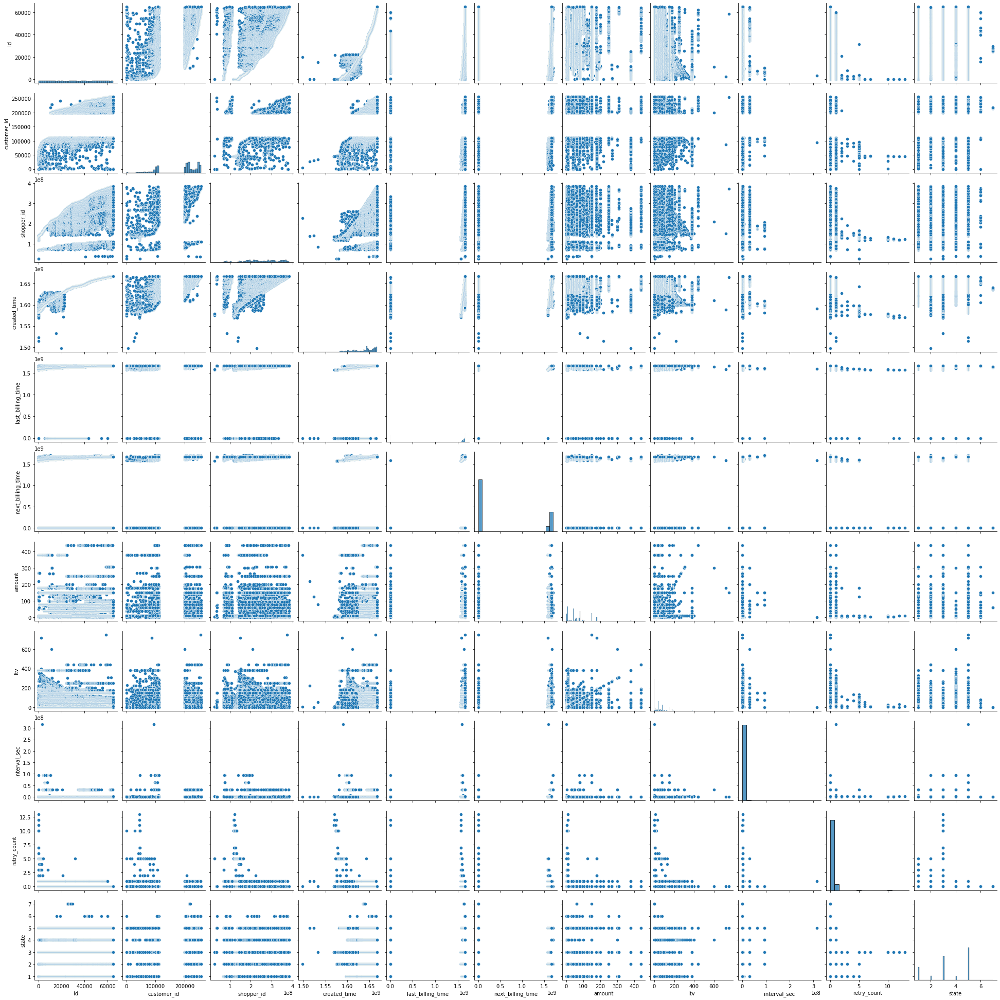

In [54]:
sns.pairplot(ccsubs) 
plt.show()

В нашому випадку це не дуже інформатвно ( хоч в цілому це досить зручно візуалізувати для задачі регресії).
Для нашої задачі є сенс дивитися на графіки розсіювання між цільовою змінною та кожним признаком окремо (незалежна змінна).

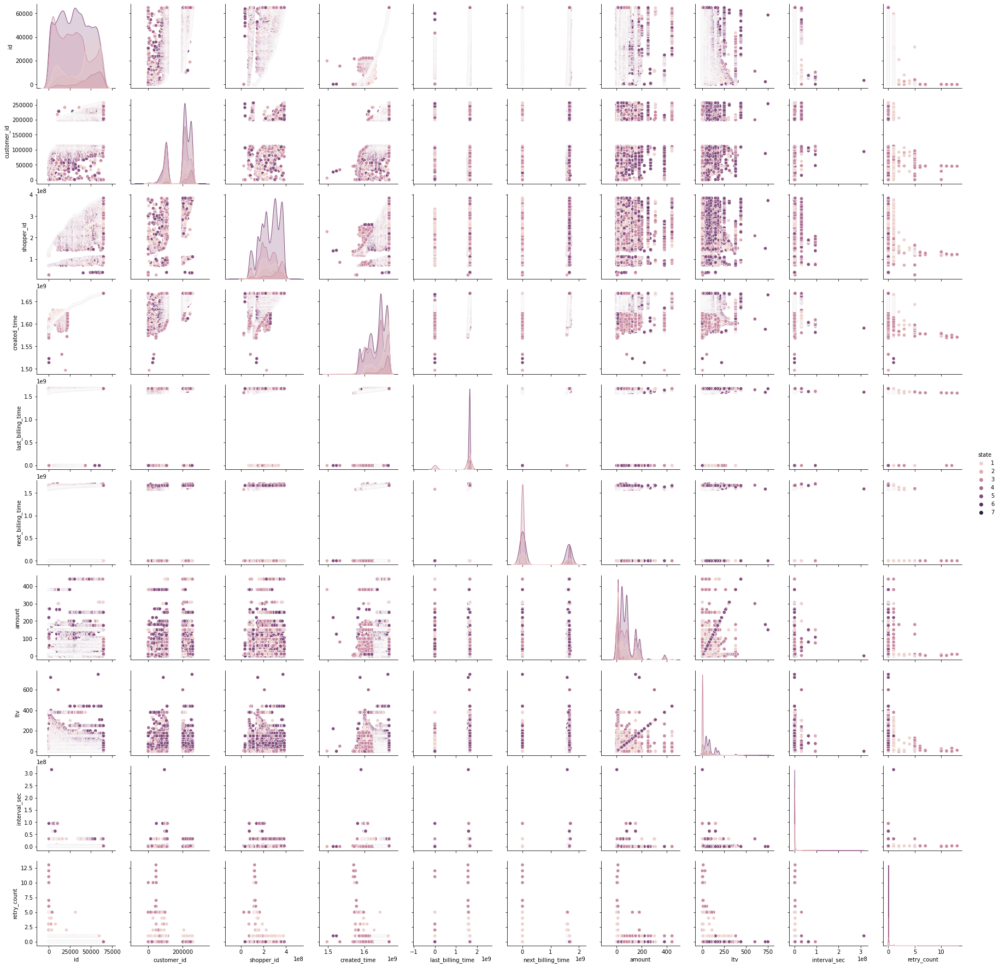

In [55]:
sns.pairplot(ccsubs, hue='state')
plt.show()   

_Для нашої задачі розділяємо кольором цільову змінну та інші на скатер-плоті,   
Інтенсивність кольру (від слабкішого до більш насиченого) по видам стану підписок ("declined":1, "canceled":2, "failed":3,  "recurring":4, "once":5,"processing":6, "free":7)._

### Виведення скатер-плотів, які показують розподіл транзакцій

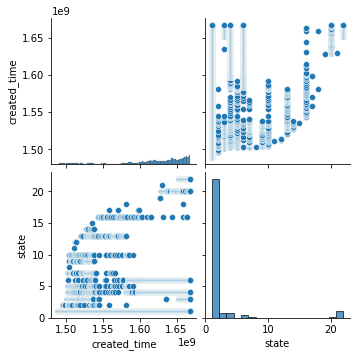

In [56]:
sns.pairplot(transac) 
plt.show()

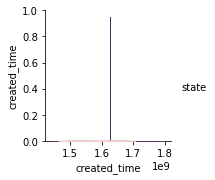

In [57]:
sns.pairplot(transac, hue='state')
plt.show()  

In [ ]:
# pairplot із таблицею "transac" не несуть інформаційного навантаження, оскільки всі стовпці, крім двох мають формат  object

In [ ]:
# pairplot з дата-фреймами df1-df5 у мене не завантажуться у звязку з великим об'ємом пам'яті (нажаль комп'ютер не витягує)

### Теплова карта з допомогою Сіборновського "heatmap"

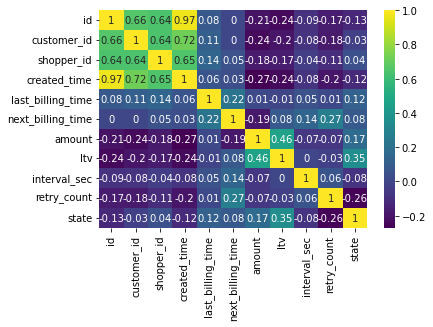

In [58]:
sns.heatmap(ccsubs.corr().round(2), annot=True, cmap='viridis')
plt.show()

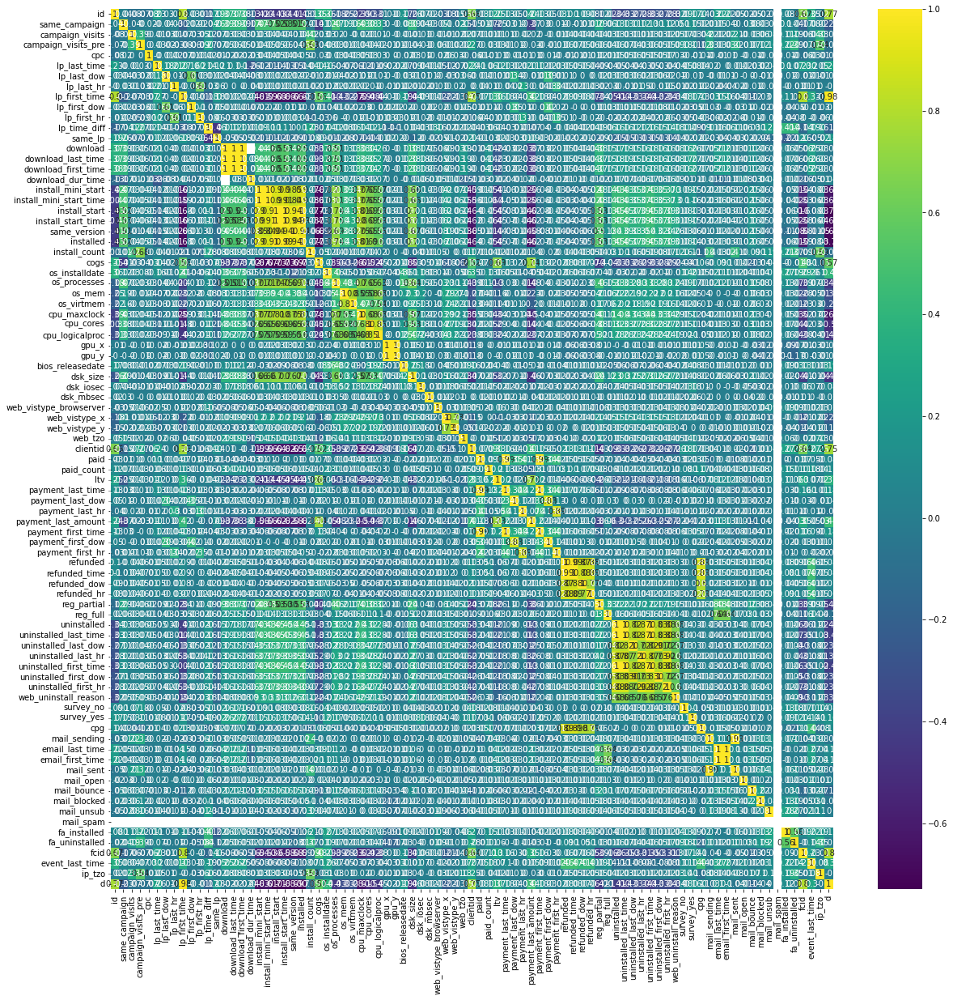

In [59]:
plt.figure(figsize=(20, 20))
sns.heatmap(df1.corr().round(2), annot=True, cmap='viridis')
plt.show()

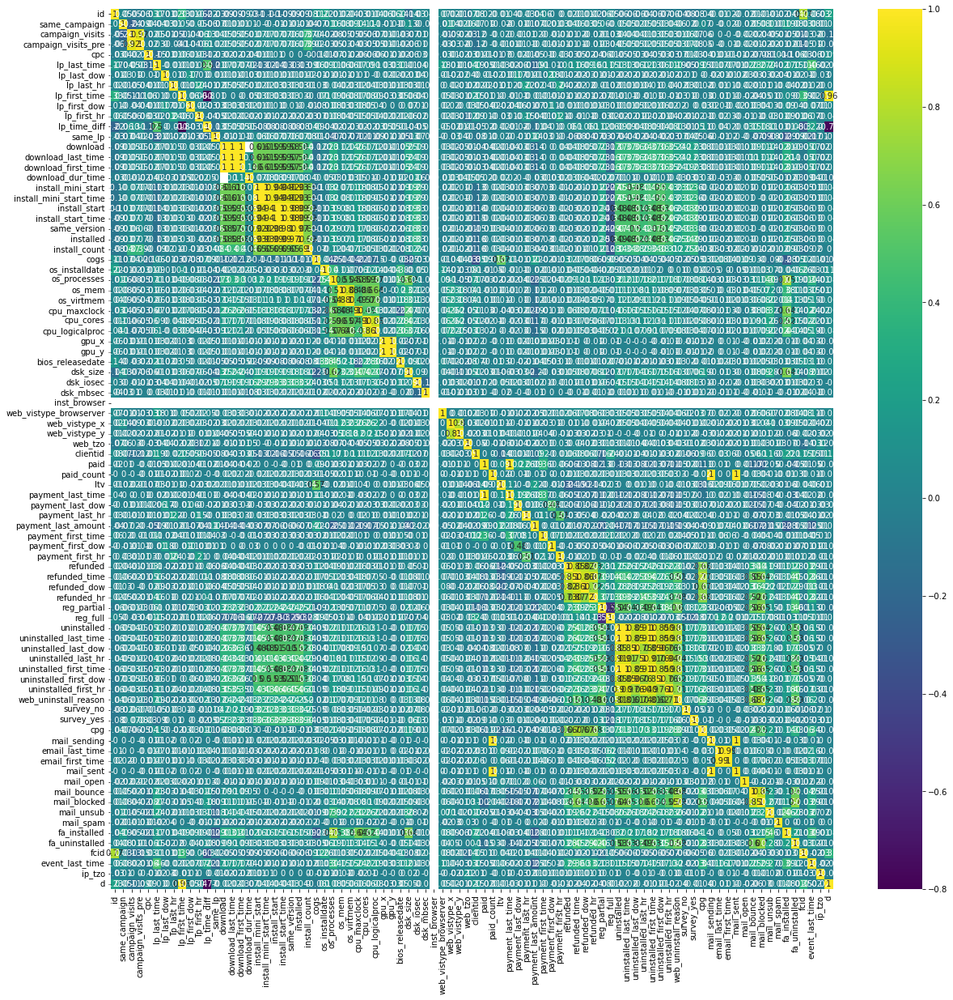

In [60]:
plt.figure(figsize=(20, 20))
sns.heatmap(df2.corr().round(2), annot=True, cmap='viridis')
plt.show()

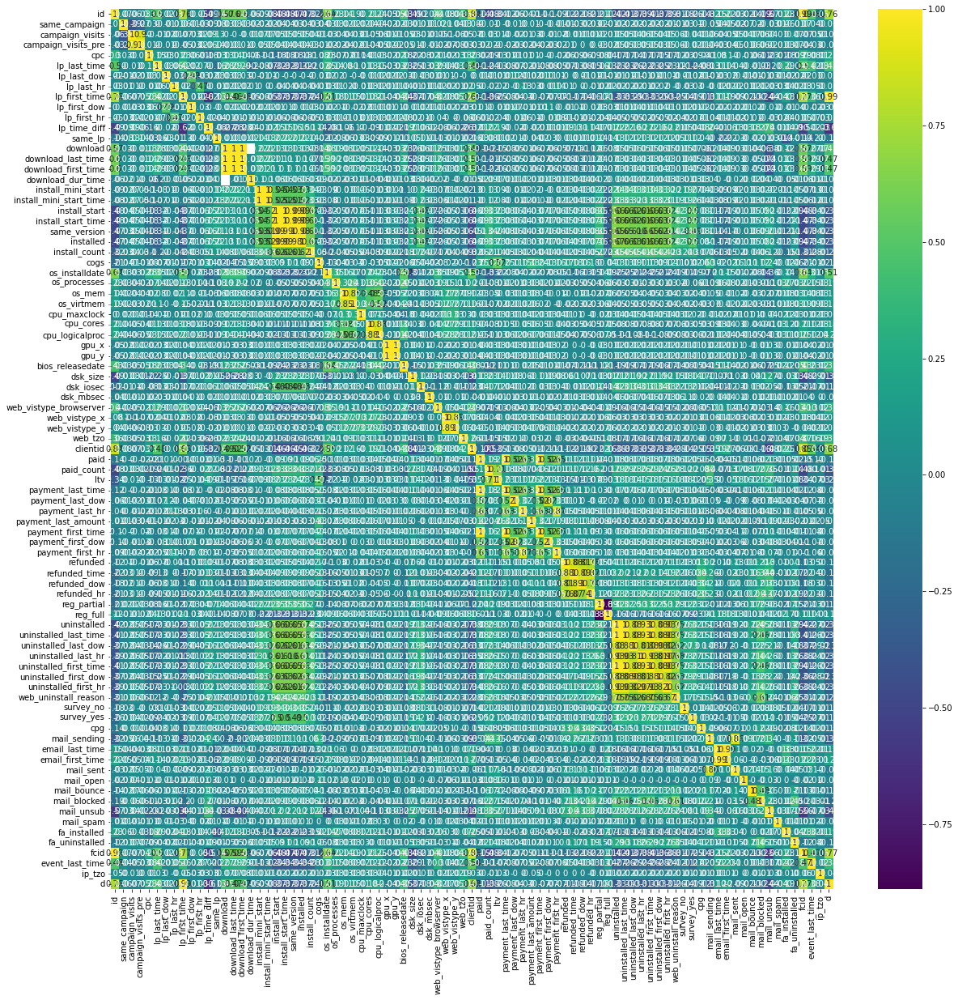

In [61]:
plt.figure(figsize=(20, 20))
sns.heatmap(df3.corr().round(2), annot=True, cmap='viridis')
plt.show()

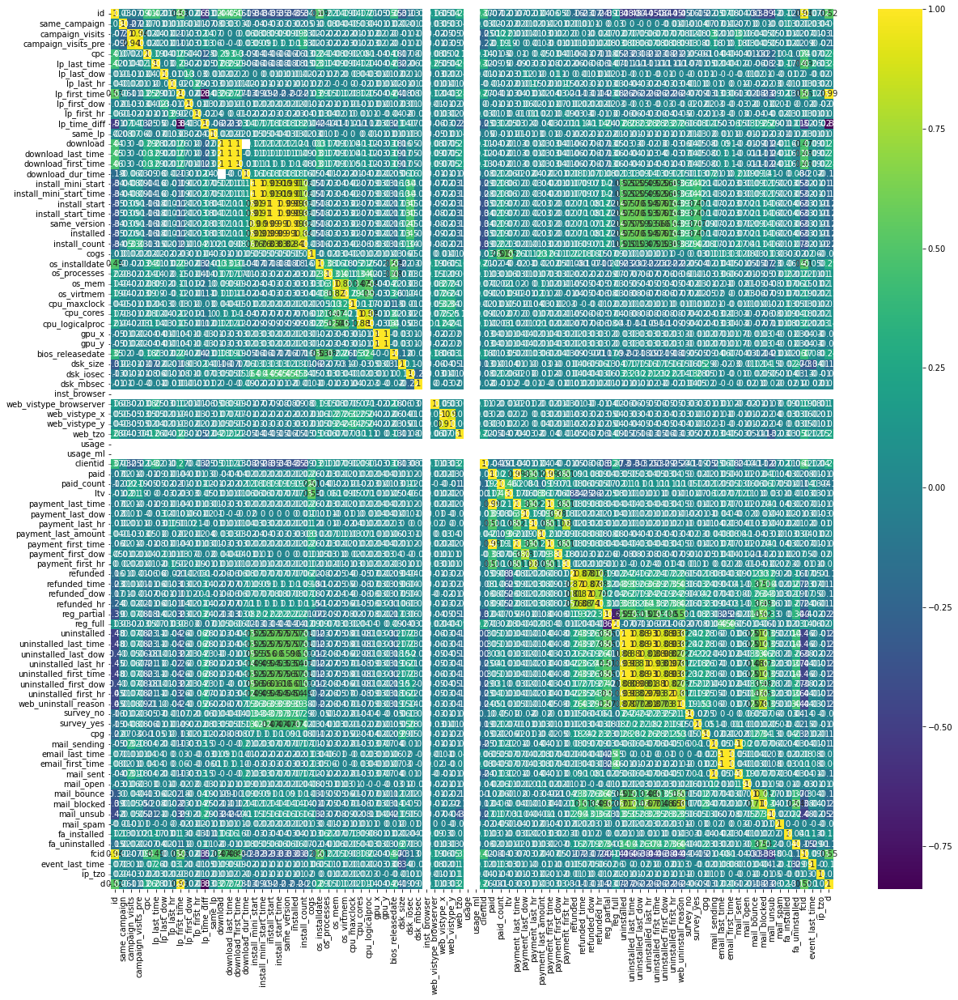

In [62]:
plt.figure(figsize=(20, 20))
sns.heatmap(df4.corr().round(2), annot=True, cmap='viridis')
plt.show()

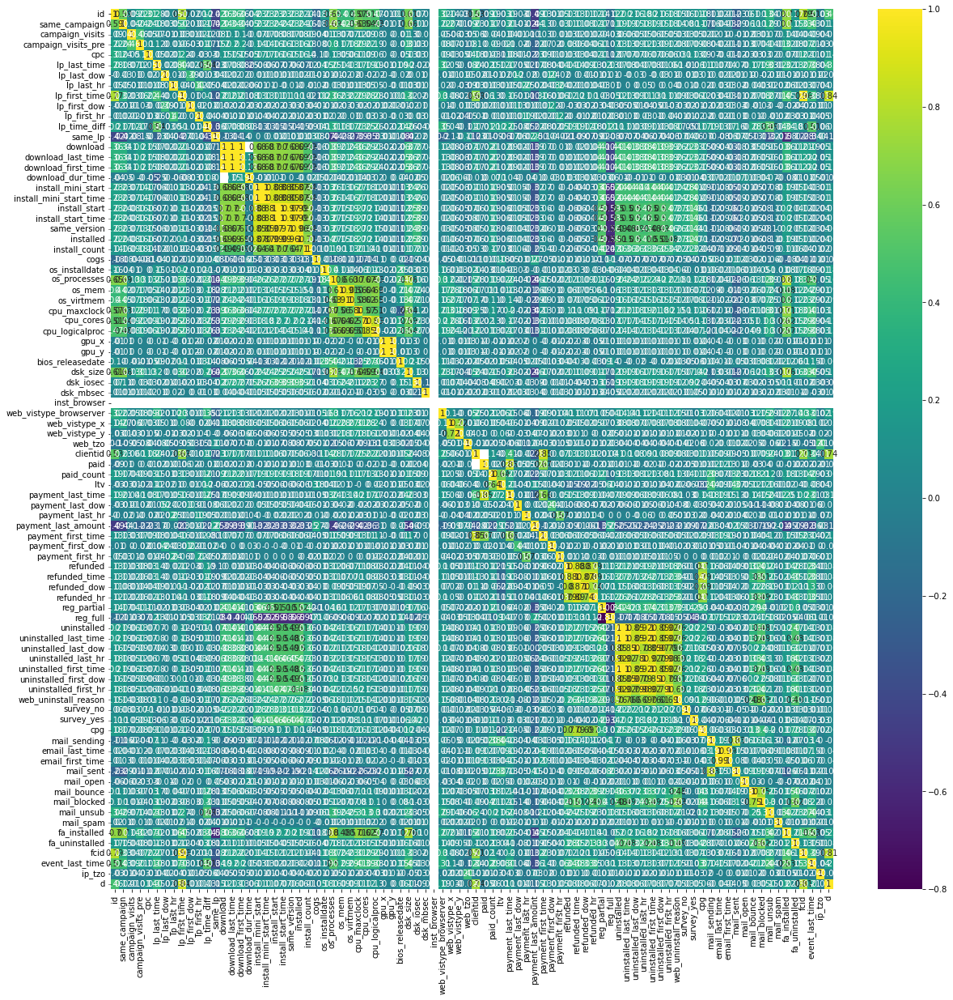

In [63]:
plt.figure(figsize=(20, 20))
sns.heatmap(df5.corr().round(2), annot=True, cmap='viridis')
plt.show()

_Теплові карти кореляції показують приблизно те ж саме, що і графіки розсіювання (скатерплоти). Порахована кореляція Пірсона показує лінійну залежність, можемо побачити стовпці, які найбільше корелюють (жовтий колір і значення наближається до 1). Варто звернути увагу, що деякі пари стовпців мають від'ємну кореляцію._

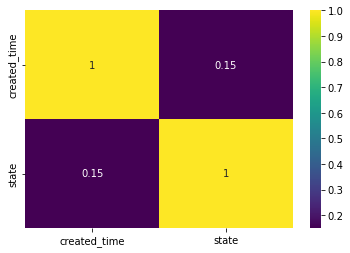

In [64]:
sns.heatmap(transac.corr().round(2), annot=True, cmap='viridis')
plt.show()

In [65]:
# Теплова карта із таблицею "transac" не несе інформаційного навантаження, оскільки всі стовпці, крім двох мають формат  object

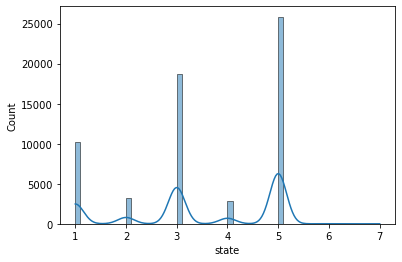

In [19]:
sns.histplot(ccsubs['state'], kde=True)
plt.show()

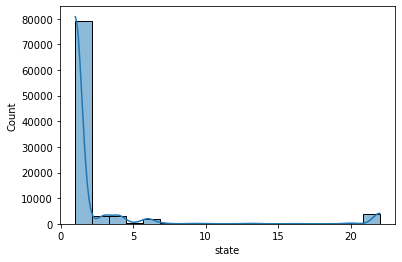

In [20]:
sns.histplot(transac['state'], kde=True)
plt.show()

_Крім того, на графіку histplot видно, що дані мають не рівномірний розподіл._

## >Попередня обробка даних

Оскільки набори даних df1, df2, df3, df4, df5 мають однакову кількість колонок і повністю співпадають за їх назвами, тому є сенс об'єднати дані набори в один. 

In [21]:
df1.shape

(3747, 148)

In [22]:
df2.shape

(4659, 148)

In [23]:
df3.shape

(4055, 148)

In [24]:
df4.shape

(5116, 148)

In [25]:
df5.shape

(3848, 148)

_Хотів об'єднати дата-фрейми df1-df5 за допомогою функції "merge", однак видає помилку "Unable to allocate 6.11 GiB for an array with shape (141, 5811939) and data type int64", нажаль комп'ютер знову не витягає. Тому прийняв рішення df1-df5 об'єднати через конкатування._

In [26]:
df = pd.concat([df1, df2, df3, df4, df5])

In [27]:
df.shape

(21425, 148)

Необхідно об'єднати набори даних підписок з транзакціями. Оскільки за умовою завдання Користувач ідентифікується ClientID і GUID (унікальний штамп ПК, зазвичай 1 ПК = 1 користувач), то є сенс об'єднувати саме за колонкою GUID.

In [28]:
transac.shape

(92167, 19)

In [29]:
ccsubs.shape

(60932, 18)

In [30]:
inner_merged_transac_ccsubs = pd.merge(transac, ccsubs, on=["guid"])

In [31]:
inner_merged_transac_ccsubs.shape

(436706, 36)

Після цього, можна 2 отримані таблиці (df та inner_merged_transac_ccsubs) об'єднати в 1 за колонками ClientID і GUID.

In [32]:
inner_joined_total_0 = pd.merge(df, inner_merged_transac_ccsubs, on=["guid"])

In [33]:
inner_joined_total_0.shape

(433634, 183)

In [34]:
inner_joined_total = df.join(
...     inner_merged_transac_ccsubs.set_index(["guid"]),
...     on=[ "guid"],
...     how="inner",
...     lsuffix="_x",
... )

In [35]:
inner_joined_total.shape

(433634, 183)

In [36]:
inner_joined_total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 433634 entries, 0 to 3847
Columns: 183 entries, id to state_y
dtypes: float64(19), int64(79), object(85)
memory usage: 608.7+ MB


In [37]:
inner_joined_total_0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 433634 entries, 0 to 433633
Columns: 183 entries, id to state_y
dtypes: float64(19), int64(79), object(85)
memory usage: 608.7+ MB


In [38]:
inner_joined_total.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,amount_y,ltv,interval_sec,retry_count,descriptor_y,meta_data,log_json,strategy_id_y,strategy_config_y,state_y
0,4568921,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,0.00,0,1,NaN,{},"[{""time"":1584172543,""comment"":""failed purchase...",NaN,{},5
13,4771733,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,0,NaN,{},"[{""time"":1583565465,""comment"":""success purchas...",NaN,{},5
14,4779297,https://webmail.tctwest.net/webmail/src/read_b...,webmail.tctwest.net,webmail.tctwest.net/webmail/src/read_body.php,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,0.00,0,1,NaN,{},"[{""time"":1583774976,""comment"":""failed purchase...",NaN,{},3
14,4779297,https://webmail.tctwest.net/webmail/src/read_b...,webmail.tctwest.net,webmail.tctwest.net/webmail/src/read_body.php,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,0,NaN,{},"[{""time"":1583776791,""comment"":""success purchas...",NaN,{},5
15,4978873,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,0,NaN,{},"[{""time"":1583590213,""comment"":""success purchas...",NaN,{},5


In [39]:
inner_joined_total_0.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,amount_y,ltv_y,interval_sec,retry_count,descriptor_y,meta_data,log_json,strategy_id_y,strategy_config_y,state_y
0,4568921,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,0.00,0,1,NaN,{},"[{""time"":1584172543,""comment"":""failed purchase...",NaN,{},5
1,4771733,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,0,NaN,{},"[{""time"":1583565465,""comment"":""success purchas...",NaN,{},5
2,4779297,https://webmail.tctwest.net/webmail/src/read_b...,webmail.tctwest.net,webmail.tctwest.net/webmail/src/read_body.php,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,0.00,0,1,NaN,{},"[{""time"":1583774976,""comment"":""failed purchase...",NaN,{},3
3,4779297,https://webmail.tctwest.net/webmail/src/read_b...,webmail.tctwest.net,webmail.tctwest.net/webmail/src/read_body.php,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,0,NaN,{},"[{""time"":1583776791,""comment"":""success purchas...",NaN,{},5
4,4978873,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,0,NaN,{},"[{""time"":1583590213,""comment"":""success purchas...",NaN,{},5


#### Виведення назв та типів усіх колонок у таблиці

In [40]:
inner_joined_total_0.iloc[:, :60].dtypes

id                           int64
referrer                    object
src_domain                  object
src_url                     object
campaign_last               object
campaign_first              object
at                          object
ai                          object
same_campaign                int64
campaign_visits              int64
campaign_visits_pre          int64
kw                          object
campaign_platform_last      object
campaign_platform_first     object
tpm                         object
cpc                        float64
dm                          object
fbclid                      object
gclid                       object
msclkid                     object
lp_last                     object
lp_last_time                 int64
lp_last_dow                  int64
lp_last_hr                   int64
lp_first                    object
lp_first_time                int64
lp_first_dow                 int64
lp_first_hr                  int64
lp_time_diff        

In [41]:
inner_joined_total_0.iloc[:, 61:120].dtypes

gpu_name                   object
gpu_x                       int64
gpu_y                       int64
sec_as                     object
sec_av                     object
sec_fw                     object
bios_releasedate          float64
dsk_name                   object
dsk_size                    int64
dsk_iosec                   int64
dsk_mbsec                   int64
inst_browser               object
web_vistype_browser        object
web_vistype_browserver    float64
web_vistype_os             object
web_vistype_gpu            object
web_vistype_x             float64
web_vistype_y             float64
web_tzo                   float64
usage                      object
usage_ml                   object
clientid                  float64
paid                        int64
paid_count                  int64
ltv_x                     float64
fa_offers                  object
payment_last_time           int64
payment_last_dow            int64
payment_last_hr             int64
payment_last_a

In [42]:
inner_joined_total_0.iloc[:, 121:180].dtypes

mail_spam              int64
fa_install            object
fa_installed           int64
fa_version_last       object
fa_version_first      object
fa_uninstalled         int64
inst_apps             object
pc_processes          object
pc_software           object
pc_hardware           object
fa_config             object
fa_strategy           object
fa_profile            object
fa_menustore          object
guid                  object
fcid                 float64
event_last_time        int64
user_agent            object
ip                    object
geo_x                 object
ip_city               object
ip_state_iso          object
ip_state_name         object
ip_tz                 object
ip_tzo                 int64
risk                  object
d                      int64
id_x                  object
customer_id_x         object
subscription_id       object
email                 object
geo_y                 object
amount_x              object
returns               object
item_name     

In [43]:
inner_joined_total_0.iloc[:, 181:183].dtypes

strategy_config_y    object
state_y               int64
dtype: object

Після аналізу даних, стає зрозумілим, що більшість стовпців з типом даних object є не цікавими (такі, що не впливають на поверненням платежу), а цікавими є наступні стовпці:'kw', 'geo_x', 'geo_y', 'returns'. Іх категоріальні значення перетворюю у цифрові.

In [44]:
inner_joined_total_0['kw'].unique() # Виведення унікальних значень у даному стовці 

array([nan, 'www12,www12.9anime.to', 'app zoom',
       'how to clean computer virus', '+norton +antivirus',
       'norton antivirus', 'norton 360 download', 'Antivirus software',
       '+download +norton +antivirus', '+buy +norton +antivirus',
       '+norton', 'zoom', 'Zoom download', 'avg antivirus',
       'download norton', 'avira', 'zoom app download', '+avg',
       '+avast +internet +security', '+avast', 'Antivirus download',
       'Zoom', 'norton power eraser', 'Gratis antivirus',
       '+avast +software', 'anti super spyware',
       '+epson +drivers +download', 'Descargar zoom', 'norton life',
       'top rated antivirus', 'Download zoom', 'Vlc', 'Steam download',
       'Descargar vlc', 'competecias para la educacion', 'vlc player',
       'the best antivirus 2020', 'telegram', 'Download zoom application',
       'Download mcafee', 'mcafee antivirus'], dtype=object)

In [45]:
inner_joined_total_0['geo_x'].unique()

array(['US', 'AU', 'NZ', 'CA', 'GB', 'IL', 'BD', 'ES', 'NO', 'ID', 'DK',
       'BR', 'BM', 'NL', 'ZA', 'TR', 'SG', 'SA', 'FR', 'KH', 'IN', 'CZ',
       'FI', 'DZ', 'HR', 'EC', 'CO', 'CR', 'LT', 'SE', 'CH', 'BE', 'GR',
       'KR', 'HU', 'CY', 'SI', 'IE', 'MN', 'AE', 'RO', 'AT', 'DE', 'JP',
       'SV', 'IT', 'PA', 'MX', 'GH', 'IS', 'PT', 'UG', 'KW', 'AO', 'TC',
       'VE', 'VN', 'PH', 'EG', 'UZ', 'UA', 'NG', 'CL', 'MM', 'PR', 'MA',
       'TW', 'VG', 'AR', 'IR', 'BW', 'BG', 'PL', 'NP', 'HN', 'MY', 'PK',
       'PE', 'PW', 'CM', 'QA', 'OM', 'BS', 'BF', 'VI', 'GP', 'CN', 'SL',
       'MP', 'NR', 'PG', 'IM', 'ZW'], dtype=object)

In [46]:
inner_joined_total_0['geo_y'].unique()

array(['US', 'AU', 'NZ', 'CA', 'GB', 'BD', nan, 'ES', 'NO', 'ID', 'DK',
       'BR', 'BM', 'NL', 'ZA', 'TR', 'SA', 'FR', 'KH', 'MY', 'IN', 'CZ',
       'FI', 'HR', 'EC', 'SG', 'CO', 'CR', 'LT', 'SE', 'CH', 'TW', 'BE',
       'GR', 'KR', 'HU', 'CY', 'SI', 'IE', 'AE', 'RO', 'PR', 'DE', 'TL',
       'JP', 'UA', 'MX', 'IL', 'SV', 'IT', 'PA', 'GH', 'IS', 'PT', 'KW',
       'AO', 'TC', 'VE', 'JM', 'PH', 'EG', 'NG', 'KE', 'HK', 'PS', 'IR',
       'CL', 'MM', 'MA', 'VG', 'AR', 'TD', 'AT', 'BW', 'BG', 'PL', 'NP',
       'HN', 'SL', 'AG', 'DO', 'BS', 'PK', 'VI', 'PE', 'PW', 'CM', 'PG',
       'QA', 'OM', 'UG', 'CK', 'VN', 'BF', 'CN', 'BZ', 'TH', 'GP', 'NF',
       'RU', 'MP', 'NR', 'IM', 'TZ', 'ZW'], dtype=object)

In [47]:
inner_joined_total_0['returns'].unique()

array(['0', '179.99', '124.99', '269.98', 0.0, '379.98', '79.99', 79.99,
       '99.99', '99.95', '49.99', '4.99', 9.99, '179', '100', '199.99',
       '9.99', 7.6, 4.99, 149.99, 74.99, 0.1, '54.99', '39.99', 104.99,
       39.99, 59.99, 179.99, 49.99, 9.84, 9.77, '149.99', 1.99, 379.98,
       '109.99', 84.99, 41.99, 140.0, '74.99', '29.99', 62.99, 28.0,
       55.99, 189.99, 119.99, 19.99, 69.99, 95.99, '27.99', 51.34, 439.99,
       '59.99', 11.5, 101.31, '189.99', 174.99, 9.81, 9.72, 26.99, '140',
       '1.99', 124.99, 28.32, '12.04', '8.14', '119.99', 175.99, 54.99,
       '18.09', 249.99, 23.11, 42.75, 107.24, 48.35, 29.99, 29.95, 30.99,
       139.99, 12.99, '39.97', '74.95', 23.03, 27.5, '111.99', '62.99',
       '69.99', 98.99, '16.1', '15.09', 44.23, 11.99, 11.12, '5.77',
       99.99, 70.0, 4.16, 41.1, 11.61, 21.77, 7.89, '229.99', 0.08,
       '14.82', '39.87', '34.99', 24.99, 78.25, 10.04, '43.69', 38.26,
       9.86, 147.92, 44.14, '30.99', 199.99, '13.69', '9.11', 11.45

In [48]:
inner_joined_total_0['returns'] = pd.to_numeric(inner_joined_total_0['returns'], errors='coerce')

In [49]:
inner_joined_total_0['returns'].unique()

array([0.0000e+00, 1.7999e+02, 1.2499e+02, 2.6998e+02, 3.7998e+02,
       7.9990e+01, 9.9990e+01, 9.9950e+01, 4.9990e+01, 4.9900e+00,
       9.9900e+00, 1.7900e+02, 1.0000e+02, 1.9999e+02, 7.6000e+00,
       1.4999e+02, 7.4990e+01, 1.0000e-01, 5.4990e+01, 3.9990e+01,
       1.0499e+02, 5.9990e+01, 9.8400e+00, 9.7700e+00, 1.9900e+00,
       1.0999e+02, 8.4990e+01, 4.1990e+01, 1.4000e+02, 2.9990e+01,
       6.2990e+01, 2.8000e+01, 5.5990e+01, 1.8999e+02, 1.1999e+02,
       1.9990e+01, 6.9990e+01, 9.5990e+01, 2.7990e+01, 5.1340e+01,
       4.3999e+02, 1.1500e+01, 1.0131e+02, 1.7499e+02, 9.8100e+00,
       9.7200e+00, 2.6990e+01, 2.8320e+01, 1.2040e+01, 8.1400e+00,
       1.7599e+02, 1.8090e+01, 2.4999e+02, 2.3110e+01, 4.2750e+01,
       1.0724e+02, 4.8350e+01, 2.9950e+01, 3.0990e+01, 1.3999e+02,
       1.2990e+01, 3.9970e+01, 7.4950e+01, 2.3030e+01, 2.7500e+01,
       1.1199e+02, 9.8990e+01, 1.6100e+01, 1.5090e+01, 4.4230e+01,
       1.1990e+01, 1.1120e+01, 5.7700e+00, 7.0000e+01, 4.1600e

Інші стовпці пробував перекодовувати за допомогою OneHotEncoder, однак помилка з пам'ятю знову. Ось приклад із стовпцем "kw"

In [52]:
# Створюю об'єкт OneHotEncoder
encoder = OneHotEncoder()

# Створив масив значень зі стовпця "kw"
kw_values = inner_joined_total_0['kw'].values.reshape(-1, 1)

# Перекодовую стовпець "kw" з використанням OneHotEncoder
onehot_encoded = encoder.fit_transform(kw_values)

# Отримую матрицю OneHotEncoder у вигляді NumPy ndarray
onehot_encoded_array = onehot_encoded.toarray()

# Створюю DataFrame з перекодованим стовпцем "kw"
encoded_df = pd.DataFrame(onehot_encoded_array, columns=encoder.get_feature_names(['kw']))

# Додаю DataFrame з перекодованим стовпцем "kw" до початкової таблиці
inner_joined_total_0 = pd.concat([inner_joined_total_0, encoded_df], axis=1)

C:\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


#### Відкидання стовпців із типом 'object'

In [54]:
df_new=inner_joined_total_0.select_dtypes(exclude=['object'])
df_new

,id,same_campaign,campaign_visits,campaign_visits_pre,cpc,lp_last_time,lp_last_dow,lp_last_hr,lp_first_time,lp_first_dow,...,kw_norton life,kw_norton power eraser,kw_telegram,kw_the best antivirus 2020,kw_top rated antivirus,kw_vlc player,"kw_www12,www12.9anime.to",kw_zoom,kw_zoom app download,kw_nan
0,4568921,0,0,0,0.0000,1584172271,6,3,1581298412,7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,4771733,0,0,0,0.0000,1583748070,1,21,1583565374,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,4779297,0,0,0,0.0000,1583776693,1,11,1583573155,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,4779297,0,0,0,0.0000,1583776693,1,11,1583573155,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,4978873,0,0,0,0.0000,1583763670,1,22,1583589692,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
433629,10597539,1,1,1,0.2649,1640245358,3,22,1600386785,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
433630,10597539,1,1,1,0.2649,1640245358,3,22,1600386785,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
433631,10597539,1,1,1,0.2649,1640245358,3,22,1600386785,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
433632,10597539,1,1,1,0.2649,1640245358,3,22,1600386785,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
# Після мого OneHotEncoder збільшилась кількість стовпців. Що з цим робити?

#### Виведення пропущених значень у відсотках  по усім колонкам

In [60]:
df_new.isna().sum().div(df_new.shape[0]).mul(100).round(2)[:60]

id                          0.00
same_campaign               0.00
campaign_visits             0.00
campaign_visits_pre         0.00
cpc                         0.00
lp_last_time                0.00
lp_last_dow                 0.00
lp_last_hr                  0.00
lp_first_time               0.00
lp_first_dow                0.00
lp_first_hr                 0.00
lp_time_diff                0.00
same_lp                     0.00
download                    0.00
download_last_time          0.00
download_first_time         0.00
download_dur_time          23.60
install_mini_start          0.00
install_mini_start_time     0.00
install_start               0.00
install_start_time          0.00
same_version                0.00
installed                   0.00
install_count               0.00
cogs                        0.00
os_installdate              1.35
os_processes                0.00
os_mem                      0.00
os_virtmem                  0.00
cpu_maxclock                0.00
cpu_cores 

In [61]:
df_new.isna().sum().div(df_new.shape[0]).mul(100).round(2)[61:121]

uninstalled_last_dow                0.00
uninstalled_last_hr                 0.00
uninstalled_first_time              0.00
uninstalled_first_dow               0.00
uninstalled_first_hr                0.00
web_uninstall_reason                0.00
survey_no                           0.00
survey_yes                          0.00
cpg                                 0.00
mail_sending                        0.00
email_last_time                     0.00
email_first_time                    0.00
mail_sent                           0.00
mail_open                           0.00
mail_bounce                         0.00
mail_blocked                        0.00
mail_unsub                          0.00
mail_spam                           0.00
fa_installed                        0.00
fa_uninstalled                      0.00
fcid                                0.01
event_last_time                     0.00
ip_tzo                              0.00
d                                   0.00
returns         

In [62]:
df_new.isna().sum().div(df_new.shape[0]).mul(100).round(2)[122:140]

kw_avg antivirus                    0.0
kw_avira                            0.0
kw_competecias para la educacion    0.0
kw_download norton                  0.0
kw_how to clean computer virus      0.0
kw_mcafee antivirus                 0.0
kw_norton 360 download              0.0
kw_norton antivirus                 0.0
kw_norton life                      0.0
kw_norton power eraser              0.0
kw_telegram                         0.0
kw_the best antivirus 2020          0.0
kw_top rated antivirus              0.0
kw_vlc player                       0.0
kw_www12,www12.9anime.to            0.0
kw_zoom                             0.0
kw_zoom app download                0.0
kw_nan                              0.0
dtype: float64

##### Аналіз колонок з пропущеними значеннями

In [66]:
df_new['bios_releasedate'].unique()

array([  nan, 2016., 2018., 2011., 2013., 2017., 2010., 2014., 2019.,
       2015., 2012., 2020., 2009., 2006., 2021., 2007., 2008., 2022.])

In [67]:
df_new['web_vistype_browserver'].unique()

array([ 13.,  80.,  nan,  11.,  71.,  18.,  12.,  74.,  75.,  87.,   9.,
        73.,  17.,  69.,  96.,  84.,  79.,  92.,  83.,  81.,  64.,  88.,
        99.,  15.,  78., 102.,  16.,  77.,  14.,  49.,  76.,  50.,  10.,
       604.,  67.,  89.,  72.,   5., 100.,  97.,  85.,  52.,  90.,  63.,
        68.,  93.,  95.,  91., 101.,  94.,  98.,  86., 103.,  60., 106.,
       104., 107., 105.,  56.,  82.,  47.,  41.,  62.,  38.,  61.,  70.])

In [68]:
df_new['web_vistype_x'].unique()

array([ 768.,  412., 1600., 1920.,  998.,   nan, 2021., 1280., 1360.,
       1366., 1680.,  320., 1536., 1024., 3840., 1242., 1334., 1067.,
        375.,  834., 1093.,  414.,  360.,  893., 1231., 1746., 1440.,
       1152., 1239., 1200., 1587., 1670., 2560., 1025., 1422., 1098.,
       1588.,  960., 1188., 1143., 1229., 2400., 1524., 1368., 1745.,
       1391., 1664., 1474., 1607.,  914.,  534., 1106., 1384.,  985.,
       1684.,  854., 1504., 1821., 1412., 1433.,  650., 1699., 1013.,
       1438., 1371., 1011., 2133., 1620., 1347., 1068., 1301., 2048.,
       1139., 1164., 3440., 1114.,  428., 1138.,  871.,  791., 1160.,
       1340.,  384., 1707., 1197., 1111., 2000.,  800., 1289., 1260.,
        819.,  390.,  339.,  956.,  467., 1095., 1216., 1730., 1397.,
       1020., 1332.,  961., 3414., 1058., 1158.,  810., 1061., 1088.,
       1254., 1082., 1348.,  915., 1302., 1477., 1512., 1120.,  385.,
        777., 1255.,  562., 1762.,  724., 1186.,  722., 1343.,  732.,
       1671.,  896.,

In [69]:
df_new['web_vistype_y'].unique()

array([1024.,  846.,  900., 1080.,  561.,   nan, 1137.,  800.,  720.,
        768., 1050.,  676.,  892.,  864.,  568., 2160.,  698.,  750.,
        667., 1112.,  614.,  896.,  736.,  812.,  640.,  502.,  740.,
        692.,  982.,  697., 1366.,  893.,  939.,  569.,  576., 1440.,
        820.,  760.,  869.,  618.,  615.,  540.,  668.,  643.,  691.,
       1350.,  945.,  857.,  912.,  783.,  936.,  648.,  821.,  904.,
        514., 1194.,  854.,  622.,  554.,  947.,  481., 1003.,  795.,
        806.,  600.,  366.,  956.,  570.,  808.,  771., 1200.,  758.,
       1000.,  731., 1152.,  699.,  940.,  627.,  926.,  490.,  445.,
        653.,  753.,  960.,  674.,  625., 1334.,  725.,  709.,  844.,
        883.,  538.,  562., 1067.,  730.,  811.,  973.,  786.,  574.,
        888.,  541.,  596.,  684.,  651.,  931.,  597.,  705.,  609.,
        515.,  658.,  733.,  831., 1110.,  700.,  437.,  706.,  739.,
        316.,  991.,  407.,  721.,  756.,  412.,  504.,  693., 1010.,
        686.,  444.,

In [70]:
df_new['web_tzo'].unique()

array([ 240., -660.,  360., -480.,   nan, -780., -600.,    0.,  420.,
        -60., -630.,  300., -360.,  480., -120., -570.,  180., -180.,
       -330., -420.,  150.,  600., -540., -720., -240.,  210.,  540.,
       -300., -270., -390., -345.,  720.])

In [71]:
df_new['clientid'].unique()

array([ 65545.,  63518.,  64167., ..., 104999., 103937., 104720.])

In [72]:
df_new['download_dur_time'].unique()

array([          nan, 7.7000000e+01, 8.0000000e+01, ..., 6.1153539e+07,
       5.2715208e+07, 1.0438590e+06])

In [73]:
df_new['os_installdate'].unique()

array([  nan, 2019., 2020., 2018., 2014., 2017., 2016., 2021., 2022.,
       2013., 2015., 2010., 2011., 2012., 2008., 2009., 2023., 2034.])

In [65]:
df_new['fcid'].unique()

array([1.58129841e+15, 1.58356537e+15, 1.58357316e+15, ...,
       1.60038565e+15, 1.60038629e+15, 1.60038679e+15])

In [64]:
df_new['shopper_id'].unique()

array([1.42723756e+08, 1.41685516e+08, 1.42053226e+08, ...,
       1.80878868e+08, 1.81027716e+08, 1.82535232e+08])

In [ ]:
bios_releasedate            2.57
web_vistype_browserver      0.53
web_vistype_x              10.52
web_vistype_y              10.52
web_tzo                    10.67
clientid                    3.27
download_dur_time          23.60
os_installdate              1.35
fcid                                0.01
shopper_id                         10.19          # Дані колонки видалю пропуски через різні методи, як положенно

#### Відкидання не інформативних колонок

На даному етапі необхідно проаналізувати дані з метою визначення ризикових транзакцій та відповідні їм підписки та атрибути користувачів. Потрібно проаналізувати дані, щоб визначити, які фактори могли сприяти відкликанню платежів. Необхідно шукати закономірності та тенденції, які можуть свідчити про шахрайство або інші фактори, що підвищують ризик повернення платежу.

In [ ]:
# Для спрощення дропнув стовпчики з налами, щоб просто подивитись що з моделю буде

In [74]:
df_new.drop(columns=['bios_releasedate', 'web_vistype_browserver', 'web_vistype_x', 'web_vistype_y', 'web_tzo', 'clientid', 'download_dur_time',  
'os_installdate', 'fcid', 'shopper_id'], inplace=True)

_Дані Колонки є неінформативними, тому іх видаляю._

In [76]:
df_new.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
id,433634.0,1.393976e+07,6.677218e+06,667.0,1.063001e+07,1.114785e+07,1.176701e+07,2.927966e+07
same_campaign,433634.0,9.318688e-01,2.519712e-01,0.0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
campaign_visits,433634.0,1.949856e+00,2.083300e+01,0.0,1.000000e+00,1.000000e+00,1.000000e+00,1.063000e+03
campaign_visits_pre,433634.0,1.599247e+00,1.200618e+01,0.0,1.000000e+00,1.000000e+00,1.000000e+00,6.100000e+02
cpc,433634.0,3.887381e-01,2.945998e-01,0.0,2.357000e-01,3.490000e-01,4.887000e-01,1.302140e+01
...,...,...,...,...,...,...,...,...
kw_vlc player,433634.0,4.612184e-06,2.147597e-03,0.0,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
"kw_www12,www12.9anime.to",433634.0,3.551382e-04,1.884179e-02,0.0,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
kw_zoom,433634.0,2.701356e-02,1.621231e-01,0.0,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
kw_zoom app download,433634.0,7.125825e-04,2.668476e-02,0.0,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00


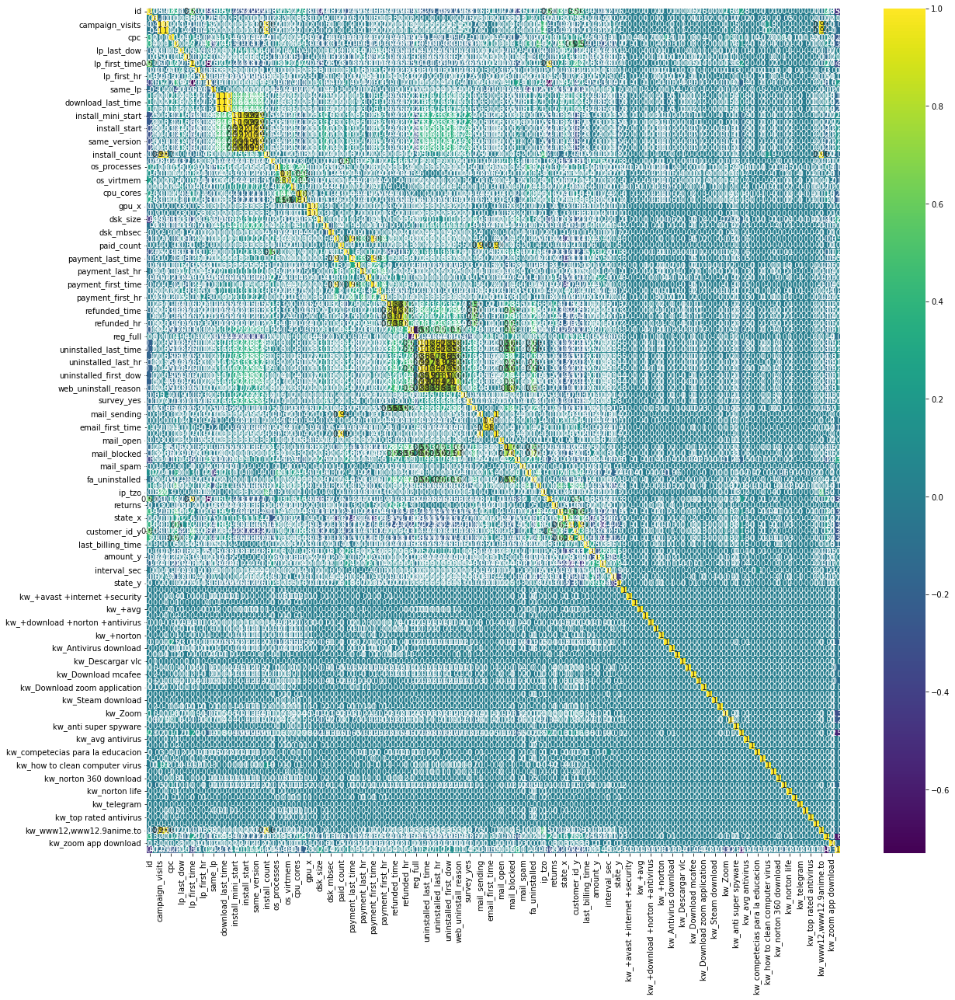

In [77]:
plt.figure(figsize=(20, 20))
sns.heatmap(df_new.corr().round(2), annot=True, cmap='viridis')
plt.show()

## На мій погляд, для вирішення задачі пошуку ризикованих транзакцій, які стануть поверненням платежів, можна використати модель машинного навчання класифікації.

Поділ даних за цільвою змінною 'state_x'

In [ ]:
# Є питання, у маїх даних зявилась колонка з даними підназвою  'state_х', яку обрати?

In [91]:
df_new['state_x'].unique()

array([ 1,  6,  4,  3, 16,  7, 22, 13, 20, 21, 19], dtype=int64)

In [92]:
df_new['state_y'].unique()

array([5, 3, 1, 4, 2, 6, 7], dtype=int64)

In [ ]:
# Виходячи з цього, необхідно брати за цільову змінну 'state_x'

In [93]:
X = df_new.drop(columns=['state_x']).dropna(axis=1)
y = df_new['state_x']

## Побудова базової моделі

In [94]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

logmodel = LogisticRegression()
logmodel.fit(X_train, y_train)

# accuracy - % правильно "вгаданих" значень 
print('Score на трейні', logmodel.score(X_train, y_train))
print('Score на тесті', logmodel.score(X_test, y_test))

C:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Score на трейні 0.8225966638481051
Score на тесті 0.8239352821260227


## Побудова простої логістичної регресії

In [95]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler


X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

logmodel = LogisticRegression()

logmodel.fit(X_train,y_train)

# accuracy - % правильно "вгаданих" значень 
print('Score на трейні', logmodel.score(X_train,y_train))

print('Score на тесті', logmodel.score(X_test,y_test))

C:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Score на трейні 0.8225966638481051
Score на тесті 0.8239352821260227


## Побудова логістичної регресії з маштабуванням 

In [97]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

logmodel = make_pipeline(MinMaxScaler(), LogisticRegression())

logmodel.fit(X_train,y_train)

# accuracy - % правильно "вгаданих" значень 
print('Score на трейні', logmodel.score(X_train,y_train))

print('Score на тесті', logmodel.score(X_test,y_test))

C:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Score на трейні 0.8905680682604351
Score на тесті 0.8906087132987114


## Побудова моделі на основі дерев рішень

In [98]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

model = DecisionTreeClassifier()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

model.fit(X_train, y_train)

DecisionTreeClassifier()

In [99]:
model.score(X_test, y_test)

0.97917147100333

In [100]:
scores = cross_val_score(estimator=DecisionTreeClassifier(max_depth=5), X=X, y=y, scoring='accuracy', cv=5)
print(scores)
print(scores.mean())

C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


[nan nan nan nan nan]
nan


C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
5 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 937, in fit
    super().fit(
  File "C:\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 165, in fit
    X, y = self._validate_data(
  File "C:\anaconda3\lib\site-packages\sklearn\base.py", line 578, in _validate_data
    X = check_array(X, **check_X_para

In [ ]:
# чомусь тут помилку видало

In [103]:
for i in range(1, 30):
    m = DecisionTreeClassifier(max_depth=i)
    scores = cross_val_score(estimator=m, X=X, y=y, scoring='accuracy', cv=5)
    print(i, '\t', scores.mean())

C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
4 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 937, in fit
    super().fit(
  File "C:\anaconda3\lib\site-packages\sklearn\tree\_cl

1 	 nan


C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
3 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 937, in fit
    super().fit(
  File "C:\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 165, in fit
    X, y = self._validate_data(
  File "C:\anaconda3\lib\site-packages\sklearn\base.py", line 578, in _validate_data
    X = check_array(X, **check_X_para

2 	 nan
3 	 0.8411655521994961


C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


4 	 0.8660574854329826


C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


5 	 0.8729803622116842


C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


6 	 0.8849535983741527


C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


7 	 0.8962465617641009


C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


8 	 0.8973465507048232


C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


9 	 0.8947683451334127


C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


10 	 0.8770737411810113


C:\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
# Довго вантажило, тому ядро зупинив, але вже якість на деревах почала падати, тому і сенсу нема далі чекати

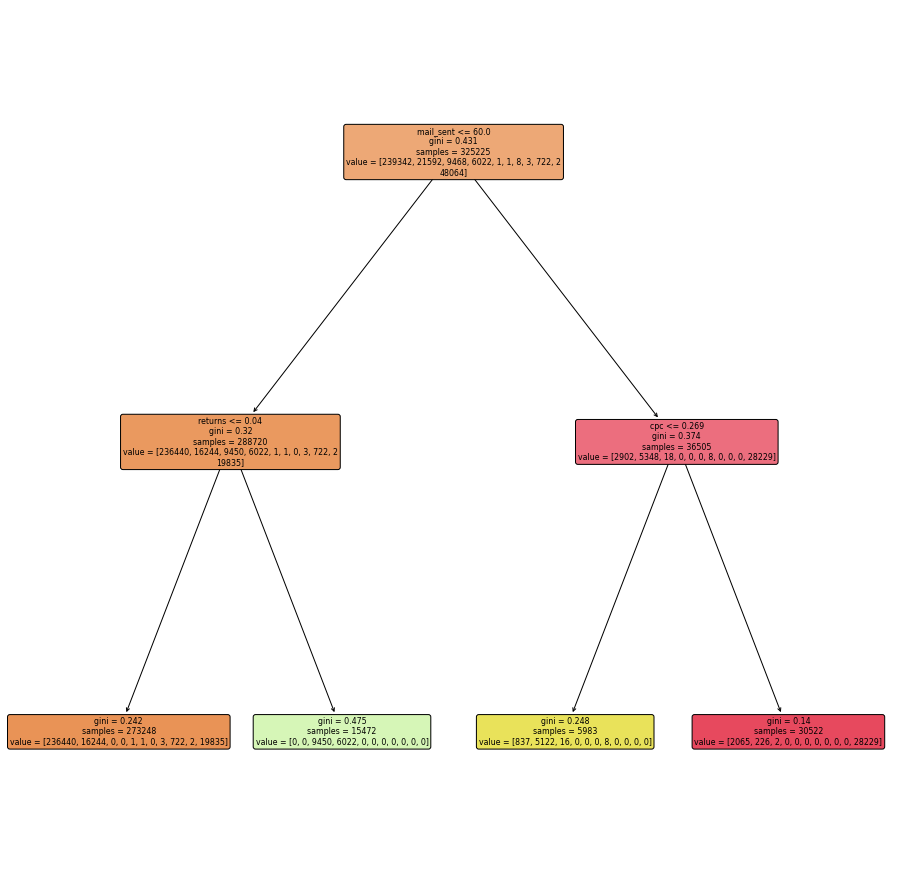

In [101]:
model = DecisionTreeClassifier(max_depth=2)
model.fit(X_train, y_train)

plt.figure(figsize=(16,16))
plot_tree(model, feature_names=X.columns, filled=True,  rounded=True)
plt.show()

# Дану можна використовувати для прогнозування ризикованих транзакцій на основі вхідних даних про нові транзакції та підписки. Модель буде класифікувати кожну транзакцію як "ризиковану" або "не ризиковану" на основі відповідних характеристик, і тим самим допомагати уникнути повернень платежів.

In [ ]:
# ПИТАННЯ є ще головне: Чи потрібно шукати ризиковані транзакції з наявного набору даних, яка 
#стане поверненням платежу (стан=відкликання або відшкодування+комісії)?